
###  由于数据中不存在缺失值，所以本数据集不进行缺失值补全和对比的工作，相关工作已在winemae-data_first150k中进行
# 由于同一数据集中数据处理方式相同，数据集的分析报告见
## Youtube-US.csv

------------------------------------------------------------------------------------------我是分割线------------------------------------------------------------------------------------------------

##  一、数据可视化和摘要

## 1.1  数据集摘要
YouTube（世界着名的视频分享网站）维护着平台上热门视频的列表。 根据Variety杂志的报道，“为了确定年度最热门的视频，YouTube使用了多种因素，包括衡量用户互动（观看次数，分享，评论和喜欢）。 请注意，它们不是整个日历年中观看次数最多的视频“。 YouTube趋势列表中的优秀表演者是音乐视频（例如着名的男性化的“Gangam Style”），名人和/或真人秀电视节目，以及YouTube众所周知的随机照相机病毒视频。

此数据集是热门YouTube热门视频的每日记录。数据集中包含各个地区的视频的[video_id], [trending_date], [title], [channel_title], [category_id],[publish_time], [tags], [views], [likes], [dislikes], [comment_count],[humbnail_link],[comments_disabled],[ratings_disable]，[ideo_error_or_removed],[description']等信息
      

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pandas import DataFrame,Series
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures 

In [27]:
filename='C:/Users/Administrator/Desktop/coda/youtube-new/CAvideos.csv'
df=pd.read_csv(filename)

In [28]:
cols = df.columns
print(df.shape)
print(cols)

(40881, 16)
Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description'],
      dtype='object')


In [29]:
cname='channel_title'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

channel_title
#AndresSTyle                                                      3
#Mind Warehouse                                                  34
#SeekingTheTruth                                                  1
* Martyna *                                                       3
- 欢迎订阅 -浙江卫视【奔跑吧】官方频道                                            36
-Wen Zhao Official文昭談古論今                                          6
078jordan1                                                        2
0b1knob                                                           1
10 MillionTM                                                      1
10-Minutes Satisfaction                                           3
102.7KIISFM                                                       2
12up                                                              1
1508kieran                                                        1
15251521ac                                                        1
16 zku                            

In [30]:
cname='category_id'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

category_id
1      2060
2       353
10     3731
15      369
17     2787
19      392
20     1344
22     4105
23     3773
24    13451
25     4159
26     2007
27      991
28     1155
29       74
30        6
43      124
dtype: int64


In [31]:
cname='publish_time'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

publish_time
2008-01-13T01:32:16.000Z     2
2008-02-12T20:26:00.000Z     3
2009-02-13T06:17:12.000Z     1
2010-01-24T09:21:55.000Z     3
2012-12-31T23:14:54.000Z     1
2013-03-20T02:14:16.000Z     1
2013-05-06T04:00:30.000Z     2
2013-05-25T04:09:26.000Z     1
2013-07-31T18:33:42.000Z     2
2013-11-23T23:17:12.000Z     3
2014-01-12T19:29:26.000Z     1
2014-01-30T14:16:04.000Z     1
2014-02-24T00:00:28.000Z     1
2014-09-03T21:24:07.000Z     1
2014-11-04T02:36:36.000Z     1
2014-12-11T20:21:20.000Z     1
2015-04-19T00:06:21.000Z     1
2015-07-27T22:38:57.000Z     2
2015-09-09T13:19:01.000Z     1
2015-10-13T08:25:49.000Z     1
2015-10-31T23:26:15.000Z     1
2015-12-17T02:27:22.000Z     1
2016-03-21T05:57:12.000Z     2
2016-06-20T19:36:43.000Z     1
2016-09-11T01:24:52.000Z     2
2016-10-08T20:42:41.000Z     2
2016-10-12T22:12:45.000Z     1
2016-11-09T20:13:35.000Z     1
2016-11-24T21:05:31.000Z     2
2016-11-28T18:18:23.000Z     1
2016-12-08T19:29:25.000Z     1
2017-04-08T12:03:13.000Z  

In [32]:
cname='tags'
print(df[cname].head())
#pd.set_option('display.max_columns', None)#显示所有行
#pd.set_option('display.max_rows', None)#显示所有列
df.groupby(by=cname).size()


0    Eminem|"Walk"|"On"|"Water"|"Aftermath/Shady/In...
1    plush|"bad unboxing"|"unboxing"|"fan mail"|"id...
2    racist superman|"rudy"|"mancuso"|"king"|"bach"...
3    ryan|"higa"|"higatv"|"nigahiga"|"i dare you"|"...
4    edsheeran|"ed sheeran"|"acoustic"|"live"|"cove...
Name: tags, dtype: object


tags
#2018impact|"#yeg"|"#edmonton"|"#eedc"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           3
#365 #Cashflow #Toronto #6                                                                                                                                                                                                                                      

In [33]:
cname='comments_disabled'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

comments_disabled
False    40298
True       583
dtype: int64


In [34]:
cname='ratings_disabled'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

ratings_disabled
False    40602
True       279
dtype: int64


In [35]:
cname='video_error_or_removed'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

video_error_or_removed
False    40854
True        27
dtype: int64


In [36]:
cname='views'
print(df[cname].describe())
loss=len(df)-df[cname].count()
print("缺失值个数：",loss)

count    4.088100e+04
mean     1.147036e+06
std      3.390913e+06
min      7.330000e+02
25%      1.439020e+05
50%      3.712040e+05
75%      9.633020e+05
max      1.378431e+08
Name: views, dtype: float64
缺失值个数： 0


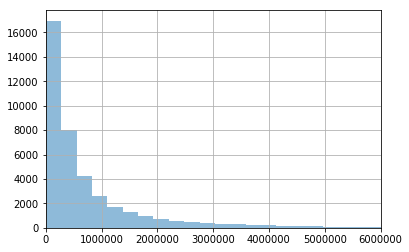

In [37]:
#直方图绘制
plt.xlim(0,6000000)
df[cname].hist(alpha=0.5,bins=500)
plt.show()

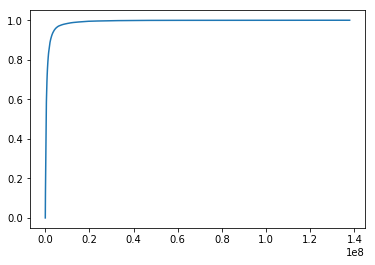

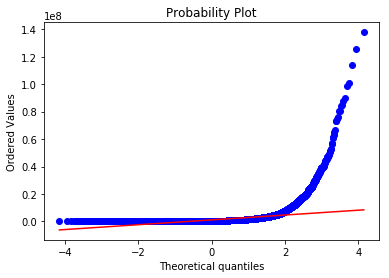

In [38]:
#累计分布图绘制
x=np.sort(df[cname])
y=np.arange(len(x))/float(len(x))
plt.plot(x,y)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(df[cname], dist="norm", plot=plt)
plt.show()

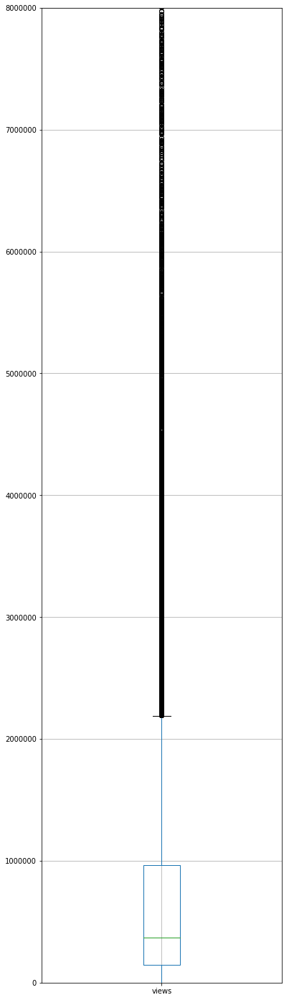

In [39]:
#盒图绘制
a=DataFrame(df,columns=[cname])
#a.boxplot()
a.boxplot(figsize=(6,25))
plt.ylim(0,8000000)
plt.show()


In [40]:
cname='likes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.088100e+04
mean     3.958269e+04
std      1.326895e+05
min      0.000000e+00
25%      2.191000e+03
50%      8.780000e+03
75%      2.871700e+04
max      5.053338e+06
Name: likes, dtype: float64
缺失值个数： 0


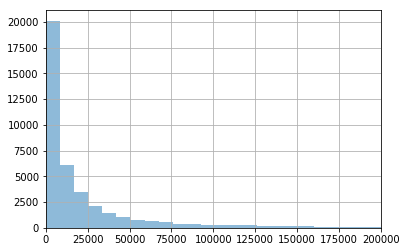

In [41]:
#直方图绘制
plt.xlim(0,200000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


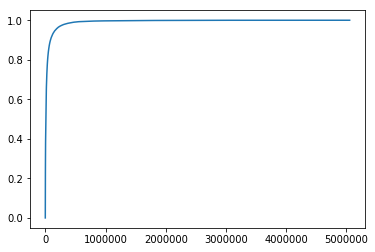

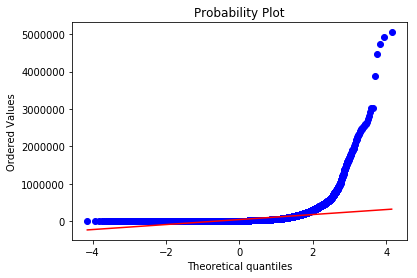

In [42]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


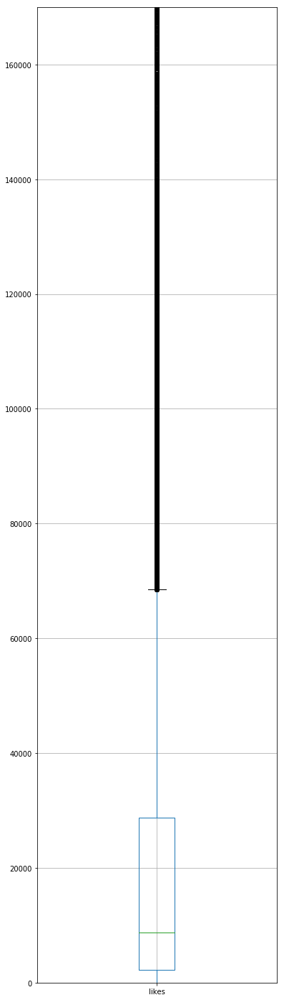

In [43]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,170000)
plt.show()

In [44]:
cname='dislikes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)

count    4.088100e+04
mean     2.009195e+03
std      1.900837e+04
min      0.000000e+00
25%      9.900000e+01
50%      3.030000e+02
75%      9.500000e+02
max      1.602383e+06
Name: dislikes, dtype: float64
缺失值个数： 0


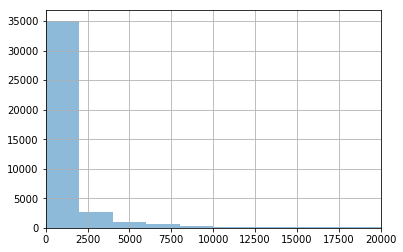

In [45]:

#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=800)
plt.show()

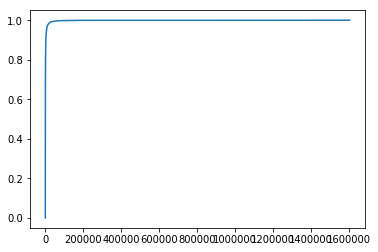

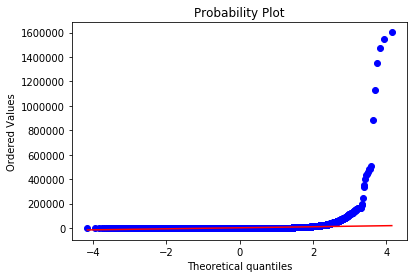

In [46]:

#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()

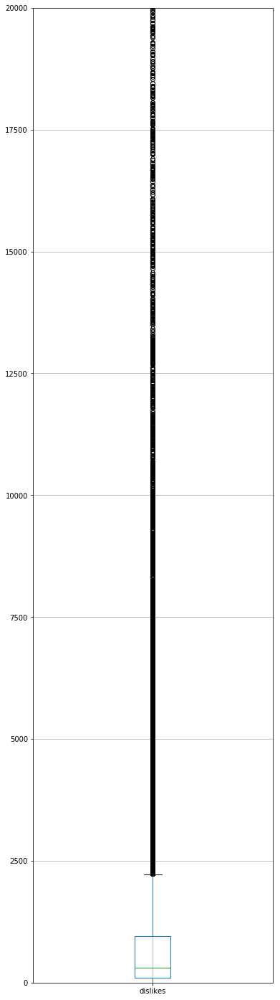

In [47]:

#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()


In [48]:
cname='comment_count'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.088100e+04
mean     5.042975e+03
std      2.157902e+04
min      0.000000e+00
25%      4.170000e+02
50%      1.301000e+03
75%      3.713000e+03
max      1.114800e+06
Name: comment_count, dtype: float64
缺失值个数： 0


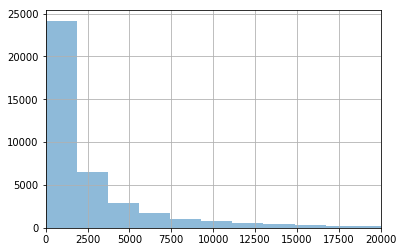

In [49]:
#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


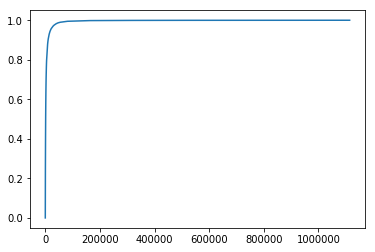

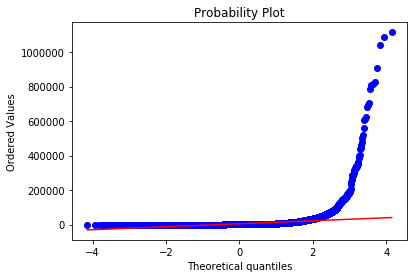

In [50]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


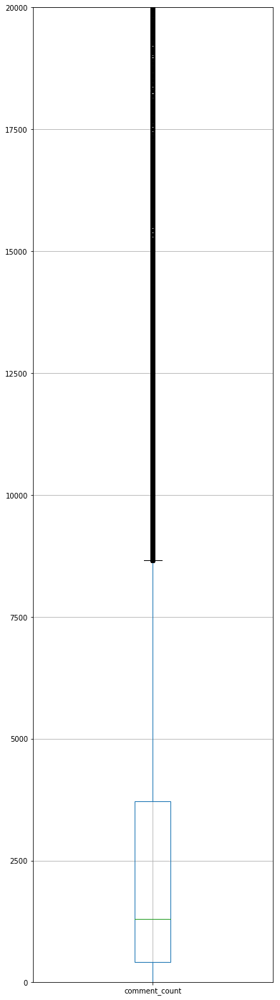

In [51]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()